In [1]:
import math
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from ipywidgets import IntProgress
import os
import cv2
import PIL
import PIL.Image
import json
import random
from random import randint as rand
from os import listdir
from os.path import isfile, join
gpus = tf.config.experimental.list_physical_devices('GPU')
print(gpus)
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

[]


In [2]:
import random
import tensorflow as tf
import matplotlib.image as mpimg
import numpy as np


def generator():
    path = r'PPE.v14i.yolokeras\update__annotations.txt'
    data = open(path, 'r').readlines()
    for el in data:
        path_image = el.replace('\n', '')
        path_label = (
            'PPE.v14i.yolokeras\\train\\labels\\'
            + path_image.split('\\')[-1].replace('\n', '') + '.txt'
        )

        bbox = []
        try:
            with open(path_label, 'r') as f:
                label = f.readlines()

            for e in label:
                if len(e) <= 1:
                    continue
                li = e.split()[1:]
                if len(li) < 4:
                    continue

                x1 = float(li[0]) * 224
                y1 = float(li[1]) * 224
                x2 = float(li[2]) * 224
                y2 = float(li[3]) * 224
                w = x2-x1
                h=y2-y1
                w=np.log(w+1e-6)
                h=np.log(h+1e-6)
                x=(x1+x2)/2
                y=(y1+y2)/2
                x1=x
                y1=y
                x2=w
                y2=h
                

                bbox.append([x1, y1, x2, y2])
                if len(bbox) >= 50:
                    break
        except FileNotFoundError:
            continue

        try:
            image = tf.image.resize(
                tf.cast(mpimg.imread(path_image), tf.float32),
                (224, 224)
            ) / 255.0
        except Exception as e:
            continue

        if len(bbox) == 0:
            continue

        # Пока ротация только 0, поэтому боксы не меняем
        rotation = random.choice([0])
        rotated_image = tf.image.rot90(image, k=rotation)

        rotated_bbox = []
        for box in bbox:
            x1, y1, x2, y2 = box

            if rotation == 1:
               
                new_x1, new_y1, new_x2, new_y2 = x1, y1, x2, y2
            elif rotation == 2:
                new_x1, new_y1, new_x2, new_y2 = x1, y1, x2, y2
            elif rotation == 3:
                new_x1, new_y1, new_x2, new_y2 = x1, y1, x2, y2
            else:
                new_x1, new_y1, new_x2, new_y2 = x1, y1, x2, y2

            rotated_bbox.append([new_x1, new_y1, new_x2, new_y2, 0.0])

        

        all_boxes = rotated_bbox 

        yield (rotated_image, tf.constant(all_boxes, dtype=tf.float32))
def valid_generator():
    path = r'PPE.v14i.yolokeras\update_test_annotations.txt'
    data = open(path, 'r').readlines()
    for el in data:
        path_image = el.replace('\n', '')
        path_label = (
            'PPE.v14i.yolokeras\\test\\labels\\'
            + path_image.split('\\')[-1].replace('\n', '') + '.txt'
        )

        bbox = []
        try:
            with open(path_label, 'r') as f:
                label = f.readlines()

            for e in label:
                if len(e) <= 1:
                    continue
                li = e.split()[1:]
                if len(li) < 4:
                    continue

                x1 = float(li[0]) * 224
                y1 = float(li[1]) * 224
                x2 = float(li[2]) * 224
                y2 = float(li[3]) * 224
                w=x2-x1
                h=y2-y1
                w=np.log(w+1e-6)
                h=np.log(h+1e-6)
                x=(x1+x2)/2
                y=(y1+y2)/2
                x1=x
                y1=y
                x2=w
                y2=h

                bbox.append([x1, y1, x2, y2])
                if len(bbox) >= 50:
                    break
        except FileNotFoundError:
            continue

        try:
            image = tf.image.resize(
                tf.cast(mpimg.imread(path_image), tf.float32),
                (224, 224)
            ) / 255.0
        except Exception as e:
            continue

        if len(bbox) == 0:
            continue

        bbox_with_flag = [[x1, y1, x2, y2, 0.0] for x1, y1, x2, y2 in bbox]

        yield (image, tf.constant(bbox_with_flag, dtype=tf.float32))
dataset = tf.data.Dataset.from_generator(
    generator,
    output_signature=(
        tf.TensorSpec(shape=(224, 224, 3), dtype=tf.float32),
        tf.TensorSpec(shape=(None, 5), dtype=tf.float32) 
    )
)

valid_dataset = tf.data.Dataset.from_generator(
    valid_generator,
    output_signature=(
        tf.TensorSpec(shape=(224, 224, 3), dtype=tf.float32),
        tf.TensorSpec(shape=(None, 5), dtype=tf.float32)  
    )
)

dataset = dataset.cache().prefetch(buffer_size=tf.data.AUTOTUNE).shuffle(100)
valid_dataset = valid_dataset.cache().prefetch(buffer_size=tf.data.AUTOTUNE)


In [3]:
backbone_encoder = tf.keras.models.load_model(
    r'models/base_classifier.h5', 
    compile=False,
)

In [4]:
classifier = tf.keras.models.load_model(
    r'models/classifier.h5', 
    compile=False,
)

In [5]:
output_tensor = backbone_encoder.output
output_tensor = classifier.layers[1](output_tensor)
output_tensor = classifier.layers[2](output_tensor)
clipped_model = tf.keras.Model(backbone_encoder.input, output_tensor)

In [6]:
clipped_model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)      │ (None, 224, 224, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ Conv1 (Conv2D)                │ (None, 112, 112, 32)      │             864 │ input_layer[0][0]          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ bn_Conv1 (BatchNormalization) │ (None, 112, 112, 32)      │             128 │ Conv1[0][0]                │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ Conv1_relu (ReLU)             │ (None, 112, 112, 32)      │               0 │ bn_Conv1[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise       │ (None, 112, 112, 32)      │             288 │ Conv1_relu[0][0]           │
│ (DepthwiseConv2D)             │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise_BN    │ (None, 112, 112, 32)      │             128 │ expanded_conv_depthwise[0… │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise_relu  │ (None, 112, 112, 32)      │               0 │ expanded_conv_depthwise_B… │
│ (ReLU)                        │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_project         │ (None, 112, 112, 16)      │             512 │ expanded_conv_depthwise_r… │
│ (Conv2D)                      │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_project_BN      │ (None, 112, 112, 16)      │              64 │ expanded_conv_project[0][… │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand (Conv2D)       │ (None, 112, 112, 96)      │           1,536 │ expanded_conv_project_BN[… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand_BN             │ (None, 112, 112, 96)      │             384 │ block_1_expand[0][0]       │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand_relu (ReLU)    │ (None, 112, 112, 96)      │               0 │ block_1_expand_BN[0][0]    │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_pad (ZeroPadding2D)   │ (None, 113, 113, 96)      │               0 │ block_1_expand_relu[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_depthwise             │ (None, 56, 56, 96)        │             864 │ block_1_pad[0][0]          │
│ (DepthwiseConv2D)             │                           │               

 Total params: 763,840 (2.91 MB)

 Trainable params: 481,856 (1.84 MB)

 Non-trainable params: 281,984 (1.08 MB)

In [7]:
X = []
y = []

for el in dataset:
    X.append(clipped_model.predict(tf.expand_dims(el[0], axis = 0), verbose = 0))
    y.append(el[1][:, :-1])

X = np.array(X)


In [8]:
y = np.array(y, dtype=object) 

In [9]:
y = y.reshape(y.shape[0], -1)

In [10]:
X = X.reshape(X.shape[0], -1)

In [11]:
X.shape

(3725, 128)

In [12]:
y.shape

(3725, 1)

In [13]:
y = [el[0].numpy().flatten() for el in y]

In [14]:
max_len = max(len(el) for el in y)

In [15]:
max_len

200

In [16]:
y_padded = []
for arr in y:
    pad_size = max_len - len(arr)
    padded = np.pad(arr, (0, pad_size), mode='constant', constant_values=0)
    y_padded.append(padded)

y = np.array(y_padded)


In [17]:
y.shape

(3725, 200)

In [18]:
X_val = []
y_val = []
for el in valid_dataset:
    X_val.append(clipped_model.predict(tf.expand_dims(el[0], axis = 0), verbose = 0))
    y_val.append(el[1][:, :-1])

X_val = np.array(X_val)


In [19]:
y_val = np.array(y_val, dtype=object)

In [20]:
X_val = X_val.reshape(X_val.shape[0], -1)

In [21]:
y_val = y_val.reshape(y_val.shape[0], -1)

In [22]:
y_val = [el[0].numpy().flatten() for el in y_val]

In [23]:
y_padded = []
for arr in y_val:
    pad_size = max_len - len(arr)
    padded = np.pad(arr, (0, pad_size), mode='constant', constant_values=0)
    y_padded.append(padded)

y_val = np.array(y_padded)

In [24]:
X_val.shape

(92, 128)

In [25]:
y_val.shape

(92, 200)

In [26]:
from catboost import CatBoostRegressor

In [31]:
cat_model = CatBoostRegressor(
    loss_function='MultiRMSE',
    
    bootstrap_type='Bernoulli', 
    subsample=0.8,            
    
    colsample_bylevel=0.3,      
    
    depth=6,                   
    
    l2_leaf_reg=3,             
    
    learning_rate=0.3,         
    iterations=1500,
    devices='0',
    od_type='Iter',
    od_wait=100,               
    
    verbose=100,
    save_snapshot=True,
    snapshot_file='catboost_training_snapshot1.bkp',
    snapshot_interval=600,
)

In [32]:
cat_model.fit(
    X, y,
    eval_set=(X_val, y_val),
    use_best_model=True
)

0:	learn: 178.8317258	test: 109.4975421	best: 109.4975421 (0)	total: 1.52s	remaining: 38m 5s
100:	learn: 95.1576874	test: 84.7453052	best: 84.6315399 (89)	total: 2m 27s	remaining: 34m 8s
200:	learn: 80.6957175	test: 80.3426667	best: 80.3070466 (199)	total: 4m 55s	remaining: 31m 50s
300:	learn: 73.2116322	test: 78.2448323	best: 78.2448323 (300)	total: 7m 20s	remaining: 29m 15s
400:	learn: 68.8249804	test: 77.8332955	best: 77.8332955 (400)	total: 9m 44s	remaining: 26m 41s
500:	learn: 65.3550510	test: 78.3038361	best: 77.6887944 (418)	total: 12m 11s	remaining: 24m 17s
Stopped by overfitting detector  (100 iterations wait)

bestTest = 77.68879436
bestIteration = 418

Shrink model to first 419 iterations.


In [33]:
from sklearn.metrics import mean_squared_error

In [65]:
y_pred = cat_model.predict(X_val)

In [35]:
mean_squared_error(y_val, y_pred)

np.float64(30.17774384763155)

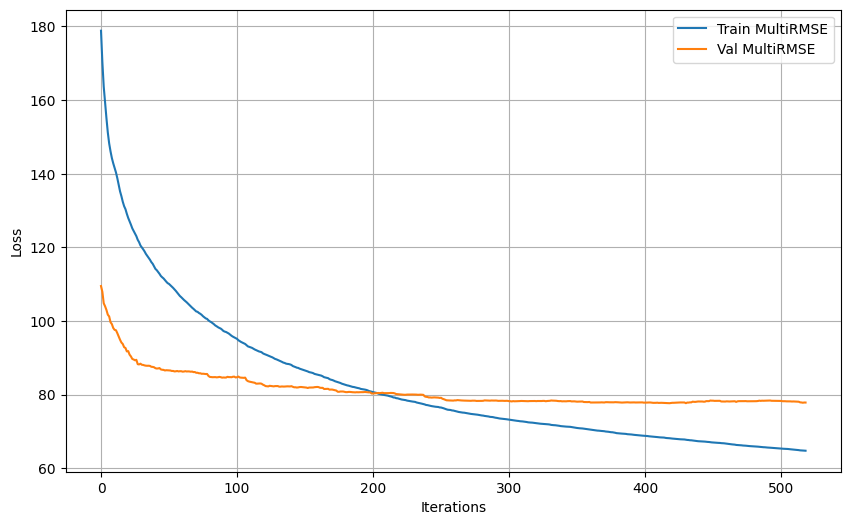

In [36]:
history = cat_model.get_evals_result()

import matplotlib.pyplot as plt

train_loss = history['learn']['MultiRMSE']
val_loss = history['validation']['MultiRMSE']

plt.figure(figsize=(10, 6))
plt.plot(train_loss, label='Train MultiRMSE')
plt.plot(val_loss, label='Val MultiRMSE')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

In [37]:
def restore_bboxes_auto(padded_array, threshold=1):
    """
    Восстанавливает bbox, автоматически определяя их количество
    
    Args:
        padded_array: 1D массив с координатами bbox
        threshold: порог для определения нулевых значений
    
    Returns:
        2D массив формы (n_bboxes, 4)
    """
    non_zero_indices = np.where(np.abs(padded_array) > threshold)[0]
    
    if len(non_zero_indices) == 0:
        return np.array([]).reshape(0, 4)
    
    last_non_zero = non_zero_indices[-1]
    
    num_elements = last_non_zero + 1
    
    if num_elements % 4 != 0:
        num_elements = (num_elements // 4) * 4
        print(f"Внимание: количество элементов {last_non_zero+1} не кратно 4. Используем {num_elements}")
    
    real_data = padded_array[:num_elements]
    
    num_bboxes = num_elements // 4
    
    return real_data.reshape(num_bboxes, 4)

restored_auto = restore_bboxes_auto(y_pred[0])
print(f"Автоматически восстановлено bbox: {restored_auto.shape}")

Внимание: количество элементов 41 не кратно 4. Используем 40
Автоматически восстановлено bbox: (10, 4)


In [38]:
y_pred = [restore_bboxes_auto(el) for el in y_pred]

Внимание: количество элементов 41 не кратно 4. Используем 40
Внимание: количество элементов 86 не кратно 4. Используем 84
Внимание: количество элементов 38 не кратно 4. Используем 36
Внимание: количество элементов 97 не кратно 4. Используем 96
Внимание: количество элементов 45 не кратно 4. Используем 44
Внимание: количество элементов 57 не кратно 4. Используем 56
Внимание: количество элементов 198 не кратно 4. Используем 196
Внимание: количество элементов 57 не кратно 4. Используем 56
Внимание: количество элементов 73 не кратно 4. Используем 72
Внимание: количество элементов 78 не кратно 4. Используем 76
Внимание: количество элементов 26 не кратно 4. Используем 24
Внимание: количество элементов 14 не кратно 4. Используем 12
Внимание: количество элементов 69 не кратно 4. Используем 68
Внимание: количество элементов 18 не кратно 4. Используем 16
Внимание: количество элементов 57 не кратно 4. Используем 56
Внимание: количество элементов 50 не кратно 4. Используем 48
Внимание: количество э

In [40]:
images = [el[0] for el in valid_dataset]

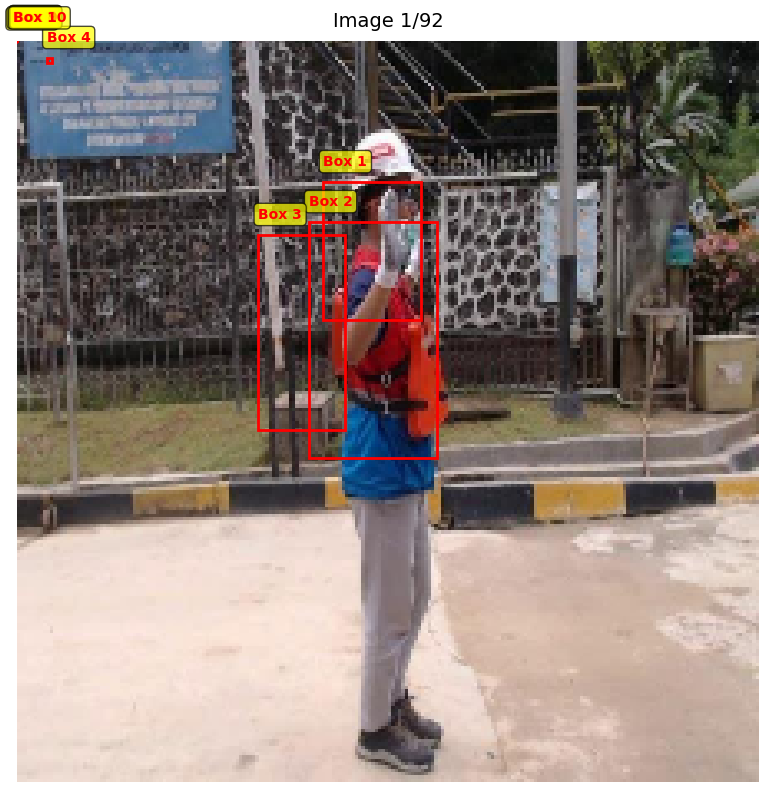

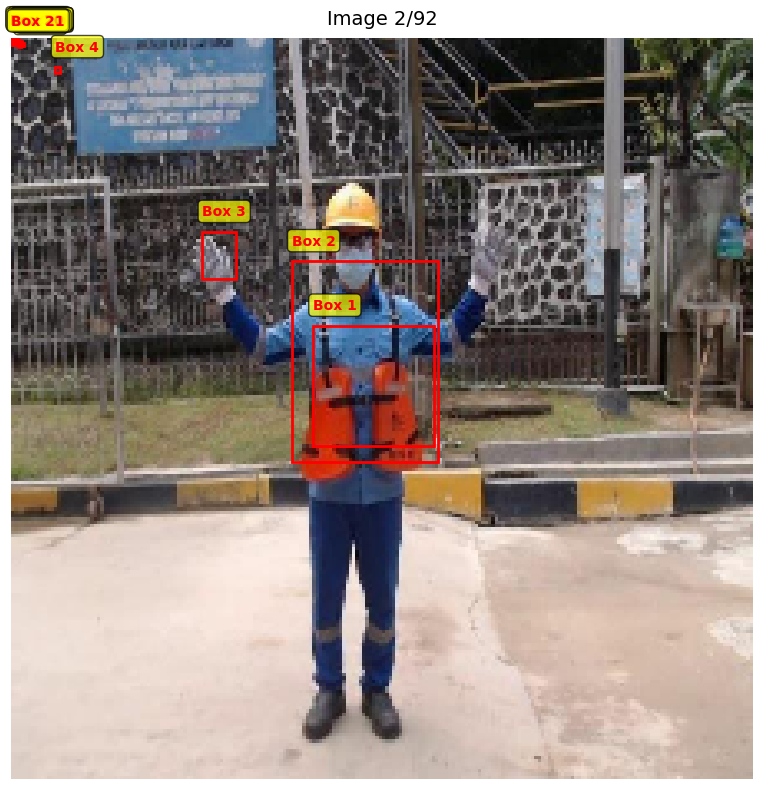

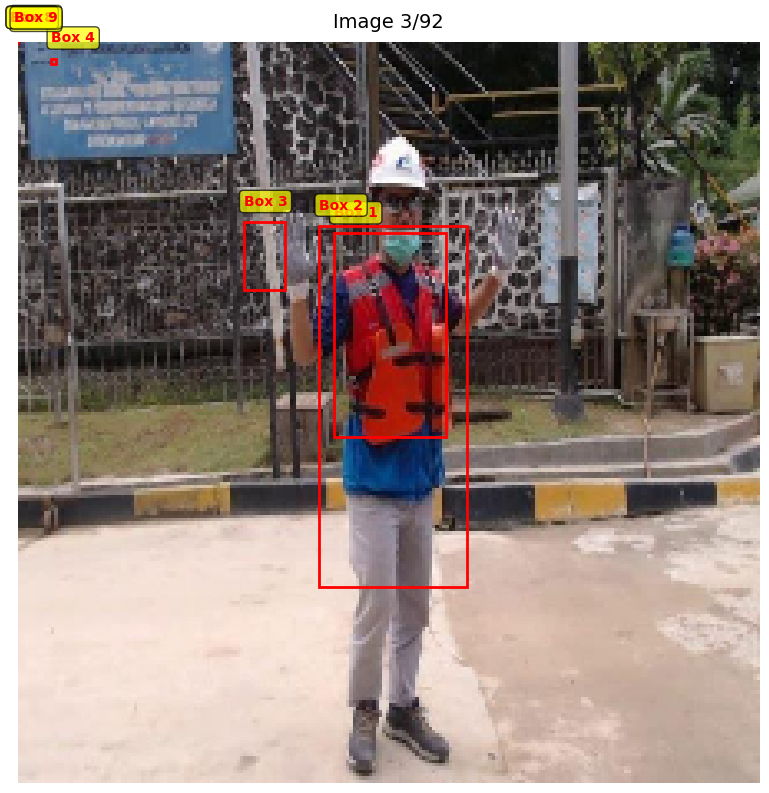

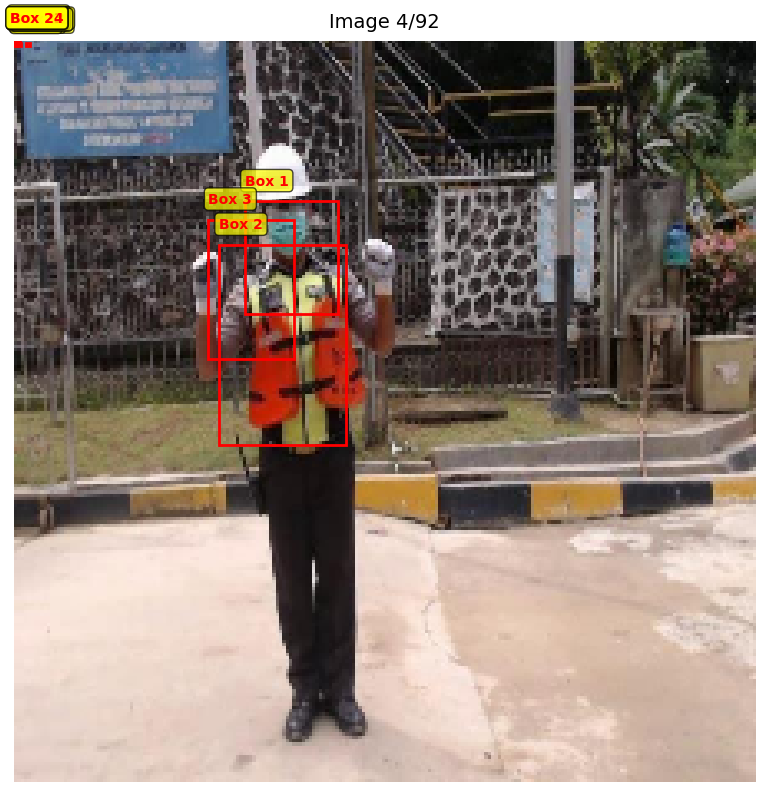

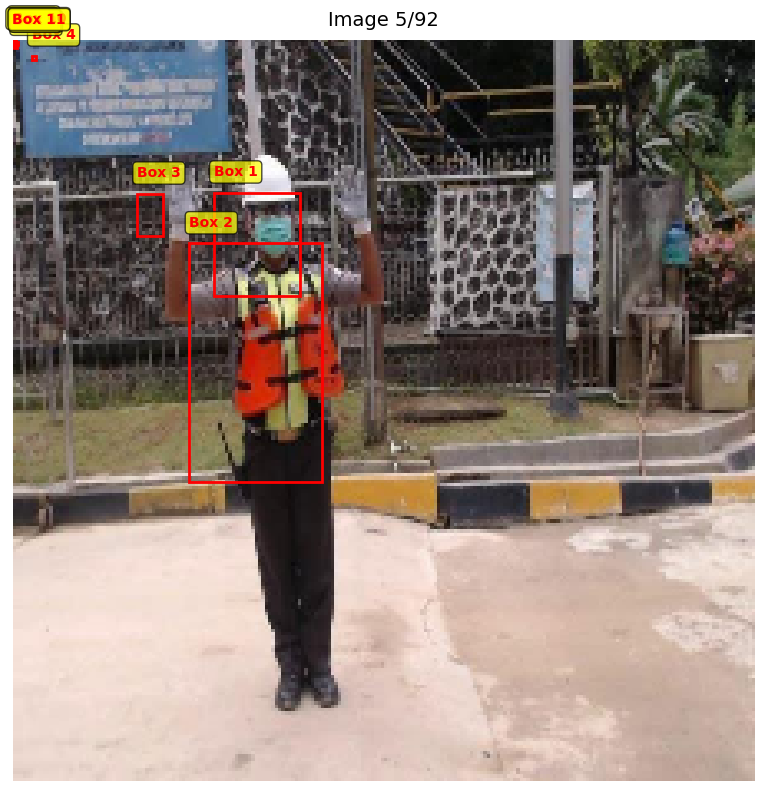

...

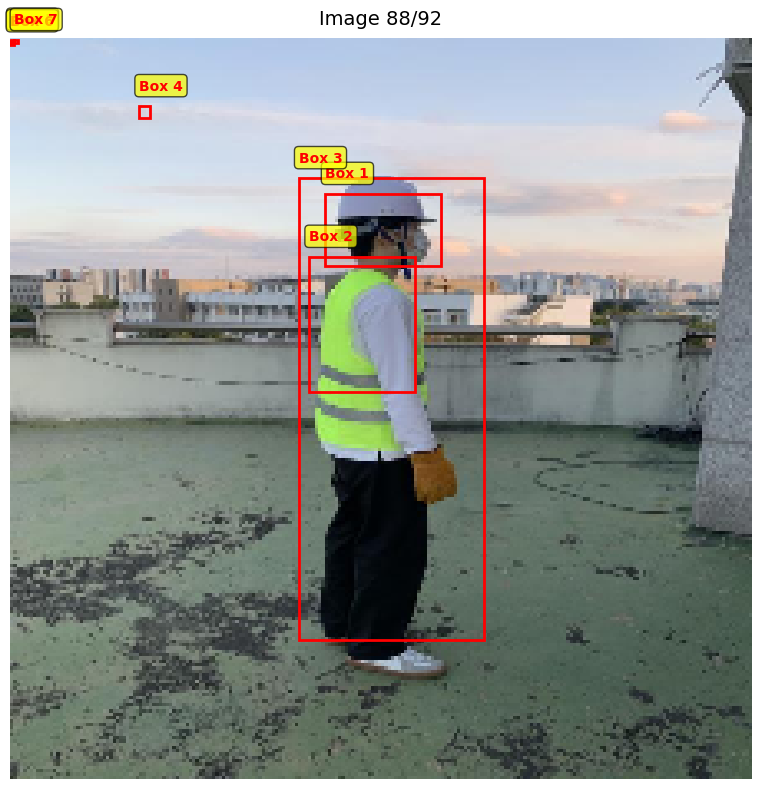

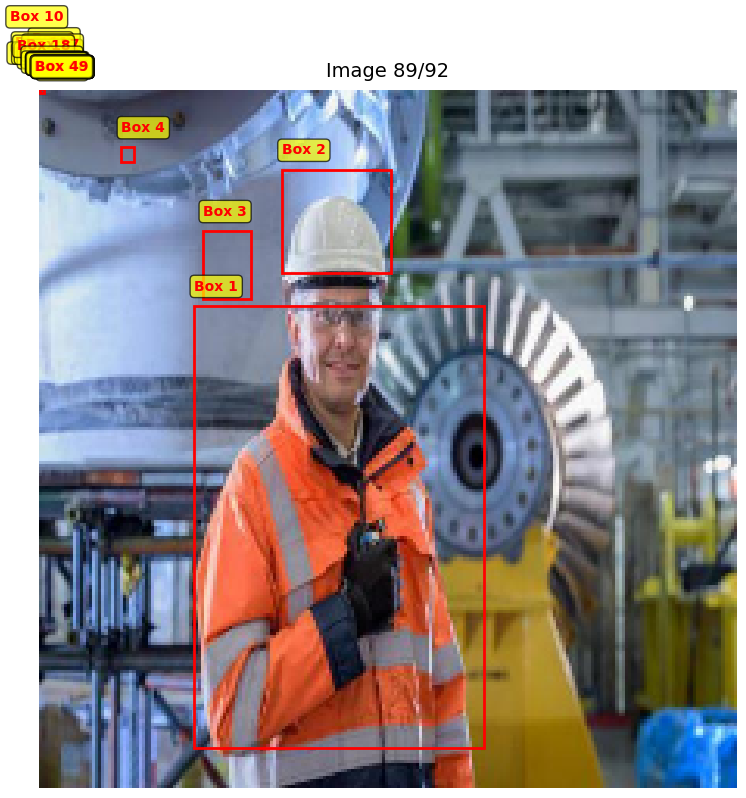

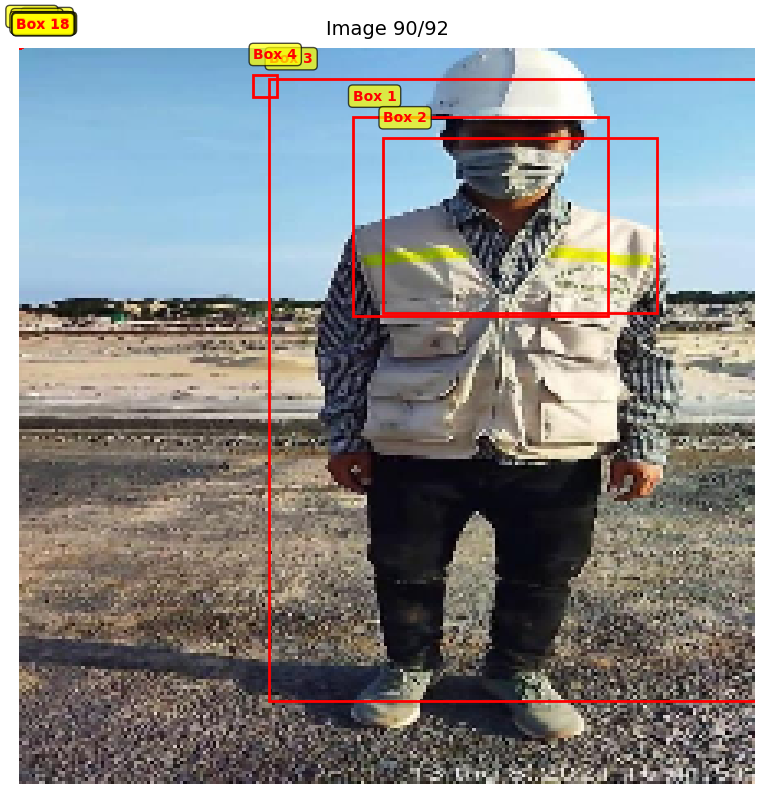

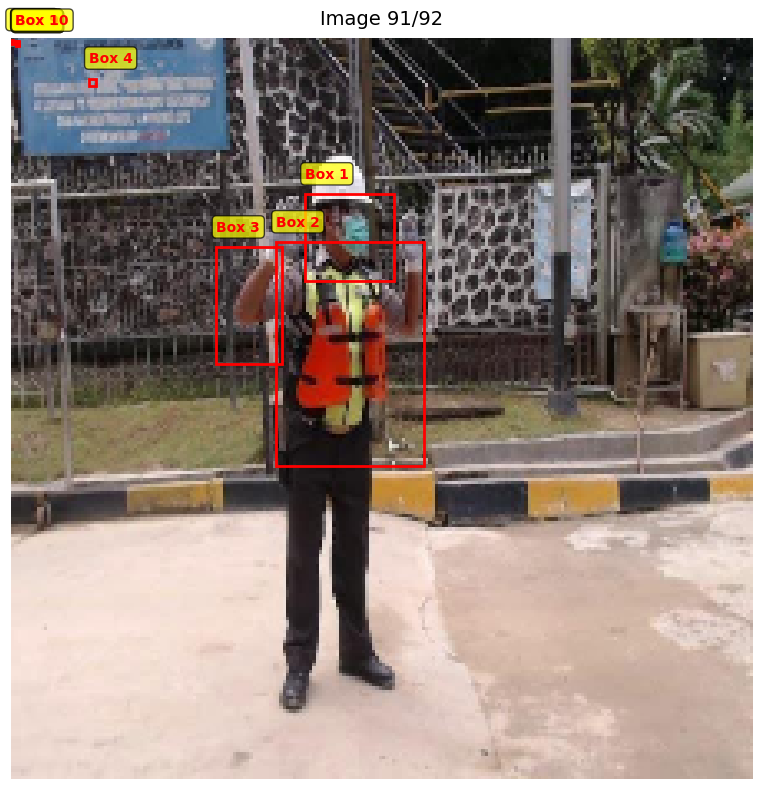

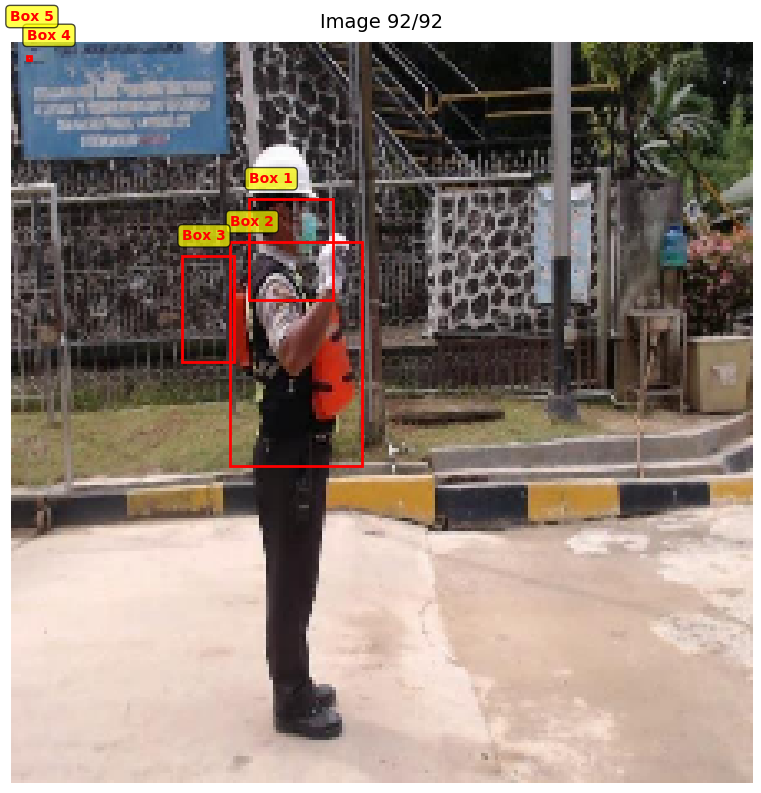


Отображено 92 изображений


In [41]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np

def visualize_predictions(images, bboxes, num_samples=5, figsize=(12, 8), conf_threshold=0.5):
    """
    Визуализирует изображения с предсказанными bounding boxes
    
    Parameters:
    -----------
    images : list
        Список изображений из valid_dataset
    bboxes : list
        Список предсказанных bbox после restore_bboxes_auto
    num_samples : int
        Количество изображений для отображения
    figsize : tuple
        Размер каждой фигуры
    conf_threshold : float
        Порог уверенности для отображения bbox (если используется)
    """
    
    num_to_show = min(num_samples, len(images), len(bboxes))
    
    for i in range(num_to_show):
        fig, ax = plt.subplots(1, figsize=figsize)
        
        ax.imshow(images[i])
        ax.axis('off')
        ax.set_title(f'Image {i+1}/{num_to_show}', fontsize=14, pad=10)
        
        img_bboxes = bboxes[i]
        
        if not isinstance(img_bboxes, (list, np.ndarray)):
            img_bboxes = [img_bboxes]
        
        if len(img_bboxes) == 0:
            ax.text(112, 112, 'No objects detected', 
                   ha='center', va='center', 
                   fontsize=12, color='red',
                   bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        else:
            for idx, bbox in enumerate(img_bboxes):
                if len(bbox) >= 4:
                    x, y, w, h = bbox[0], bbox[1], bbox[2], bbox[3]
                    w = np.exp(w)
                    h = np.exp(h)
                    x-=w/2
                    y-=h/2
                    
                 
                    rect = patches.Rectangle(
                        (x, y), w, h,
                        linewidth=2,
                        edgecolor='red',
                        facecolor='none',
                        linestyle='-'
                    )
                    ax.add_patch(rect)
                    
                    ax.text(
                        x, y - 5,
                        f'Box {idx+1}',
                        color='red',
                        fontsize=10,
                        weight='bold',
                        bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.7)
                    )
                    
                    if len(bbox) >= 5:
                        conf = float(bbox[4])
                        if conf >= conf_threshold:
                            ax.text(
                                x, y + h + 15,
                                f'Conf: {conf:.2f}',
                                color='green',
                                fontsize=9,
                                bbox=dict(boxstyle='round,pad=0.2', facecolor='white', alpha=0.7)
                            )
        
        plt.tight_layout()
        plt.show()
    
    print(f'\nОтображено {num_to_show} изображений')



visualize_predictions(images, y_pred, num_samples=100)


In [42]:
import numpy as np
import tensorflow as tf

def box_cxcywh_to_xyxy(boxes):
 
    if len(boxes) == 0:
        return np.array([])
    
    boxes = np.array(boxes)
    cx, cy = boxes[:, 0], boxes[:, 1]
    lw, lh = boxes[:, 2], boxes[:, 3]
    
    w = np.exp(lw)
    h = np.exp(lh)
    
    x1 = cx - w / 2
    y1 = cy - h / 2
    x2 = cx + w / 2
    y2 = cy + h / 2
    
    return np.stack([x1, y1, x2, y2], axis=1)

def compute_iou_batch(boxA, boxesB):
    
    if len(boxesB) == 0:
        return np.array([])

    xA = np.maximum(boxA[0], boxesB[:, 0])
    yA = np.maximum(boxA[1], boxesB[:, 1])
    xB = np.minimum(boxA[2], boxesB[:, 2])
    yB = np.minimum(boxA[3], boxesB[:, 3])

    interW = np.maximum(0, xB - xA)
    interH = np.maximum(0, yB - yA)
    interArea = interW * interH

    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxesBArea = (boxesB[:, 2] - boxesB[:, 0]) * (boxesB[:, 3] - boxesB[:, 1])

    iou = interArea / (boxAArea + boxesBArea - interArea + 1e-6)
    return iou


In [48]:
def calculate_metrics(valid_dataset, y_pred_restored, iou_threshold=0.5):
    
    
    true_positives = 0
    false_positives = 0
    false_negatives = 0
    
    total_iou_sum = 0
    total_matched_boxes = 0
    

    gt_data_list = []
    for _, labels in valid_dataset:
        gt_data_list.append(labels.numpy()[:, :-1]) 

    num_samples = min(len(gt_data_list), len(y_pred_restored))
    print(f"Расчет метрик для {num_samples} изображений...")

    for i in range(num_samples):

        gt_boxes_raw = gt_data_list[i]
        pred_boxes_raw = y_pred_restored[i]
        
        gt_boxes = box_cxcywh_to_xyxy(gt_boxes_raw)
        pred_boxes = box_cxcywh_to_xyxy(pred_boxes_raw)
        
        if len(pred_boxes) == 0:
            false_negatives += len(gt_boxes)
            continue
            
        if len(gt_boxes) == 0:
            false_positives += len(pred_boxes)
            continue
            
        gt_matched = np.zeros(len(gt_boxes), dtype=bool)
        
        for pred_box in pred_boxes:
            ious = compute_iou_batch(pred_box, gt_boxes)
            
            if len(ious) == 0:
                false_positives += 1
                continue
                
            best_iou_idx = np.argmax(ious)
            best_iou = ious[best_iou_idx]
            
            if best_iou >= iou_threshold and not gt_matched[best_iou_idx]:
                true_positives += 1
                gt_matched[best_iou_idx] = True
                
                total_iou_sum += best_iou
                total_matched_boxes += 1
            else:
                false_positives += 1
        
        false_negatives += np.sum(~gt_matched)

    precision = true_positives / (true_positives + false_positives + 1e-9)
    recall = true_positives / (true_positives + false_negatives + 1e-9)
    f1_score = 2 * (precision * recall) / (precision + recall + 1e-9)
    
    mean_iou = total_iou_sum / (total_matched_boxes + 1e-9)

    print("-" * 30)
    print(f"IOU Threshold: {iou_threshold}")
    print(f"True Positives: {true_positives}")
    print(f"False Positives: {false_positives}")
    print(f"False Negatives: {false_negatives}")
    print("-" * 30)
    print(f"Precision: {precision:.4f}")
    print(f"Recall:    {recall:.4f}")
    print(f"F1 Score:  {f1_score:.4f}")
    print(f"Mean IoU (matched): {mean_iou:.4f}")
    
    return precision, recall, mean_iou

calculate_metrics(valid_dataset, y_pred, iou_threshold=0.2)


Расчет метрик для 92 изображений...
------------------------------
IOU Threshold: 0.2
True Positives: 140
False Positives: 1060
False Negatives: 130
------------------------------
Precision: 0.1167
Recall:    0.5185
F1 Score:  0.1905
Mean IoU (matched): 0.5446


(0.11666666666656944,
 np.float64(0.5185185185165981),
 np.float64(0.5446246965756236))

In [49]:
from sklearn.linear_model import Ridge

In [50]:
baseline = Ridge(alpha = 1.0)

In [51]:
baseline.fit(X, y)

Ridge()

In [52]:
y_pred_baseline = baseline.predict(X_val)

In [53]:
mean_squared_error(y_val, y_pred_baseline)

np.float32(49.391987)

In [54]:
y_pred_baseline = [restore_bboxes_auto(el) for el in y_pred_baseline]

Внимание: количество элементов 105 не кратно 4. Используем 104
Внимание: количество элементов 74 не кратно 4. Используем 72
Внимание: количество элементов 117 не кратно 4. Используем 116
Внимание: количество элементов 198 не кратно 4. Используем 196
Внимание: количество элементов 105 не кратно 4. Используем 104
Внимание: количество элементов 77 не кратно 4. Используем 76
Внимание: количество элементов 66 не кратно 4. Используем 64
Внимание: количество элементов 105 не кратно 4. Используем 104
Внимание: количество элементов 101 не кратно 4. Используем 100
Внимание: количество элементов 121 не кратно 4. Используем 120
Внимание: количество элементов 77 не кратно 4. Используем 76
Внимание: количество элементов 105 не кратно 4. Используем 104
Внимание: количество элементов 198 не кратно 4. Используем 196
Внимание: количество элементов 77 не кратно 4. Используем 76
Внимание: количество элементов 174 не кратно 4. Используем 172
Внимание: количество элементов 121 не кратно 4. Используем 120
Вн

In [ ]:
visualize_predictions(images, y_pred_baseline, num_samples=100)


In [117]:
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
mlp_model =make_pipeline(
    StandardScaler(),
    MLPRegressor(
    hidden_layer_sizes=(256,128,64,), 
    activation='relu',          
    solver='adam',            
    batch_size=32,
    learning_rate_init=0.001,
    max_iter=500,               
    random_state=42,
    early_stopping=True         
    )
)

In [118]:
mlp_model.fit(X, y)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('mlpregressor',
                 MLPRegressor(batch_size=32, early_stopping=True,
                              hidden_layer_sizes=(256, 128, 64), max_iter=500,
                              random_state=42))])

In [119]:
y_pred_mlp = mlp_model.predict(X_val)

In [120]:
mean_squared_error(y_val, y_pred_mlp)

np.float32(29.032785)

In [121]:
y_pred_mlp = [restore_bboxes_auto(el) for el in y_pred_mlp]

Внимание: количество элементов 57 не кратно 4. Используем 56
Внимание: количество элементов 177 не кратно 4. Используем 176
Внимание: количество элементов 193 не кратно 4. Используем 192
Внимание: количество элементов 101 не кратно 4. Используем 100
Внимание: количество элементов 182 не кратно 4. Используем 180
Внимание: количество элементов 101 не кратно 4. Используем 100
Внимание: количество элементов 101 не кратно 4. Используем 100
Внимание: количество элементов 174 не кратно 4. Используем 172
Внимание: количество элементов 166 не кратно 4. Используем 164
Внимание: количество элементов 193 не кратно 4. Используем 192
Внимание: количество элементов 90 не кратно 4. Используем 88
Внимание: количество элементов 89 не кратно 4. Используем 88
Внимание: количество элементов 101 не кратно 4. Используем 100
Внимание: количество элементов 90 не кратно 4. Используем 88
Внимание: количество элементов 121 не кратно 4. Используем 120
Внимание: количество элементов 90 не кратно 4. Используем 88
Вн

In [ ]:
visualize_predictions(images, y_pred_mlp, num_samples=100)
